<a href="https://colab.research.google.com/github/melihs/skin-lesion-image-processing/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

'/content/skin-cancer9-classesisic' klasörü bulundu, veriler buradan okunacak.
Toplam Görüntü Sayısı: 118
                                                path
0  /content/skin-cancer9-classesisic/ISIC_0000056...
1  /content/skin-cancer9-classesisic/ISIC_0010803...
2  /content/skin-cancer9-classesisic/ISIC_0011478...
3  /content/skin-cancer9-classesisic/ISIC_0024383...
4  /content/skin-cancer9-classesisic/ISIC_0024450...

Ortalama Çözünürlük: [ 965 1349]
Ortalama Dosya Boyutu: 1586.24 KB

==================== GÖRÜNTÜ 1 ANALİZİ ====================
RGB -> Mean: 182.55, Std: 73.16
Gray -> Mean: 182.22, Std: 71.76


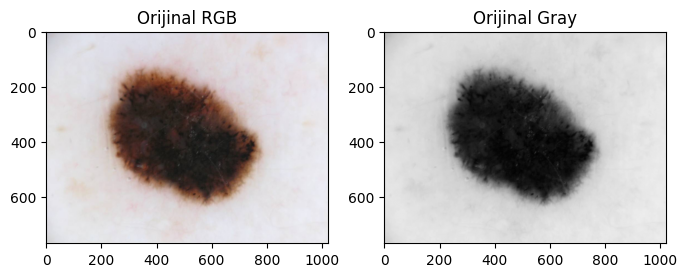

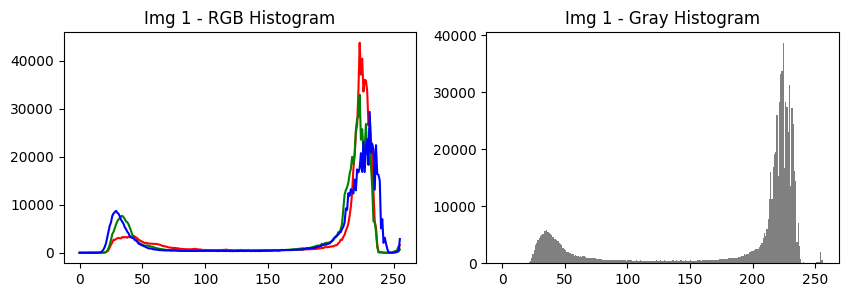

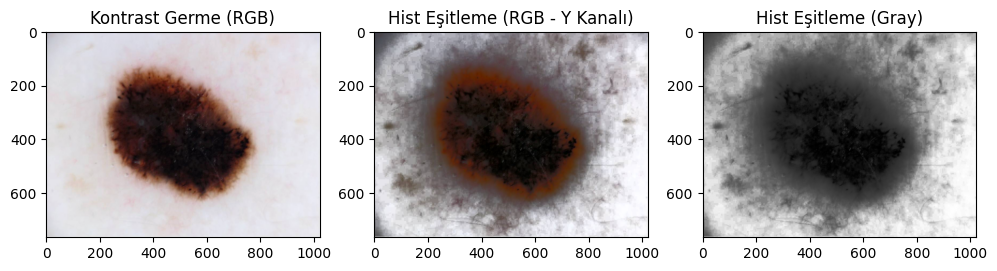

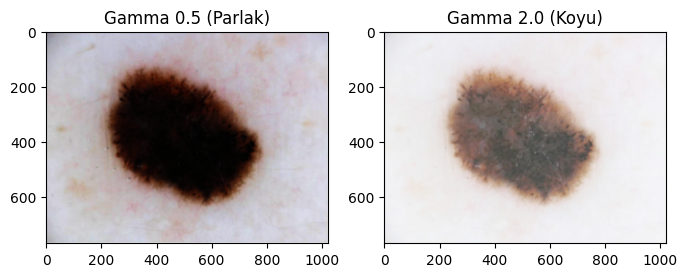

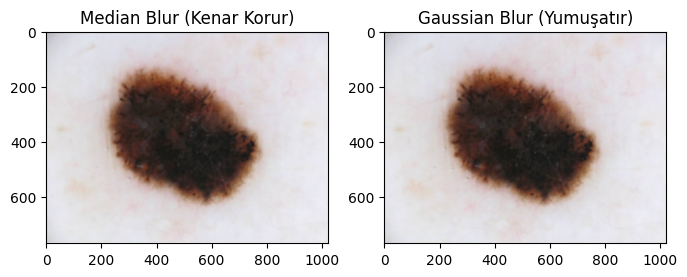

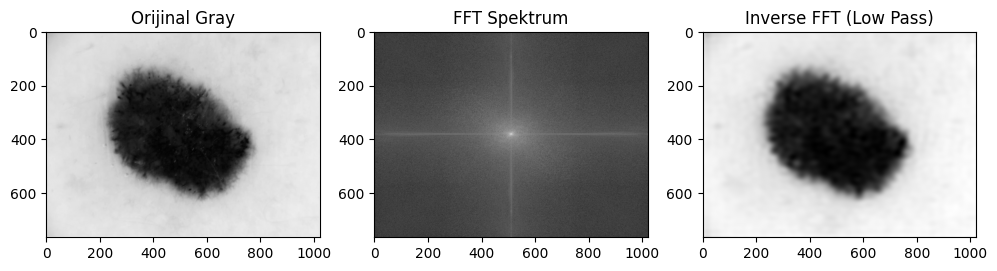

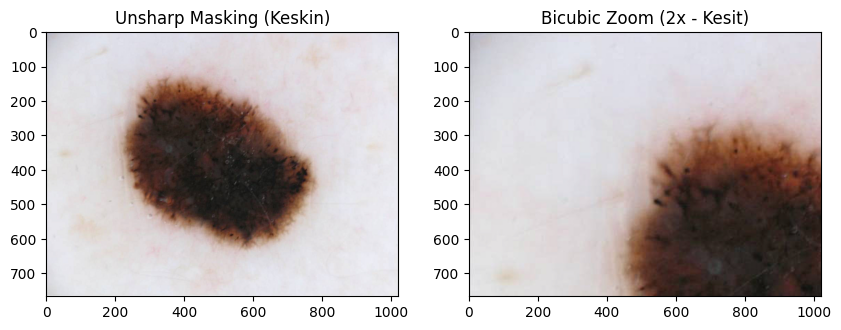


==================== GÖRÜNTÜ 2 ANALİZİ ====================
RGB -> Mean: 162.93, Std: 31.57
Gray -> Mean: 158.55, Std: 14.72


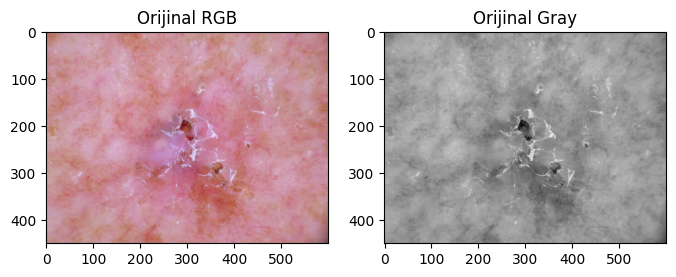

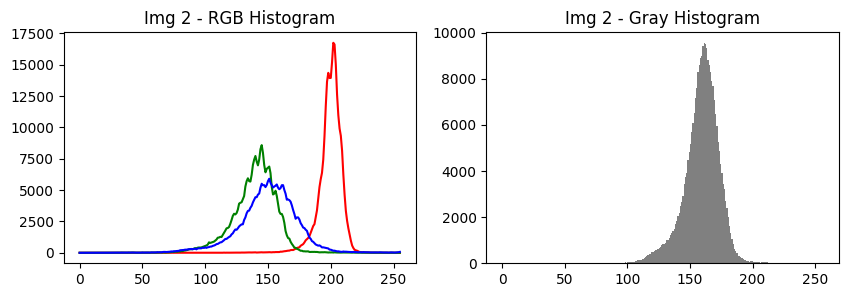

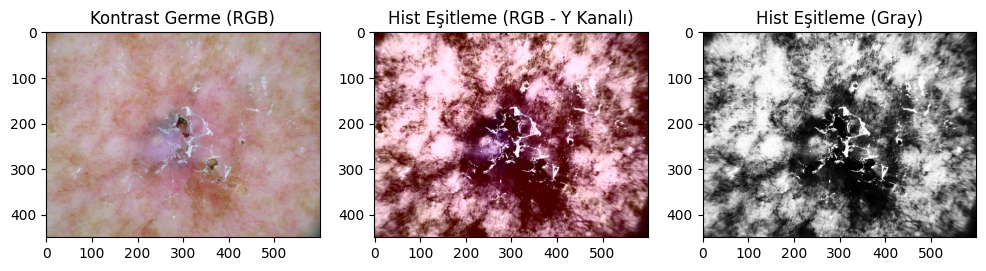

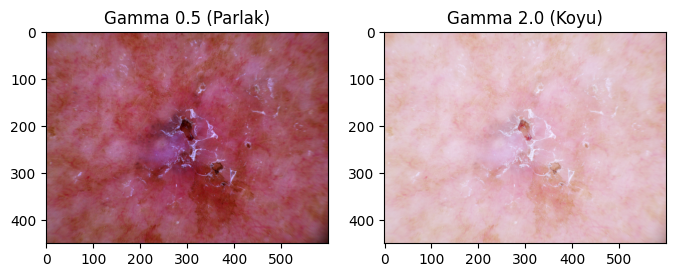

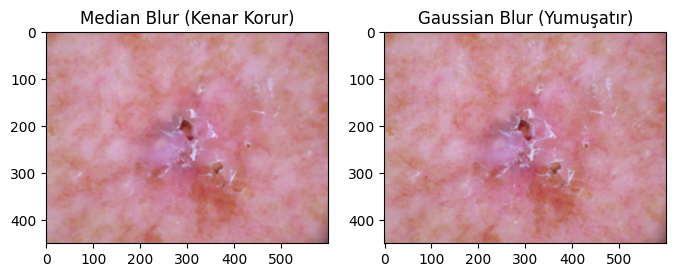

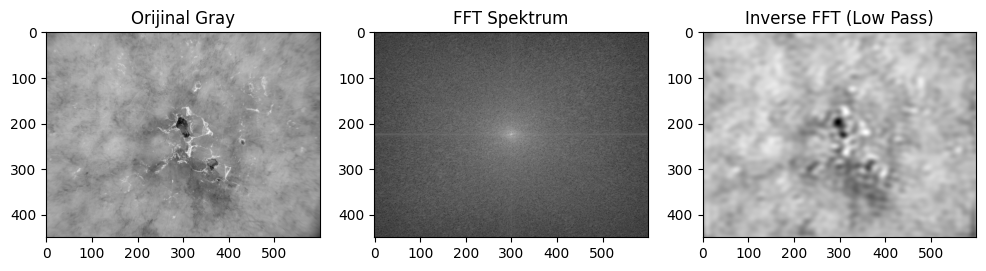

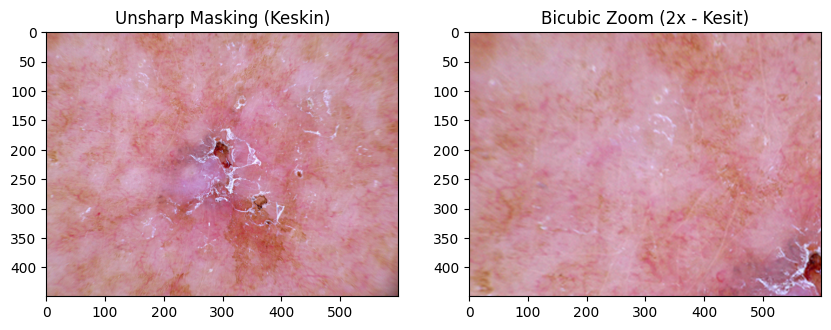


==================== GÖRÜNTÜ 3 ANALİZİ ====================
RGB -> Mean: 170.42, Std: 40.68
Gray -> Mean: 168.48, Std: 31.24


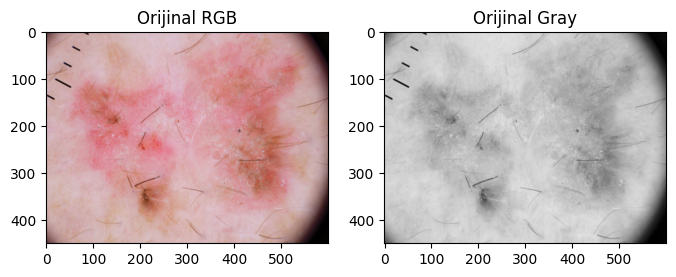

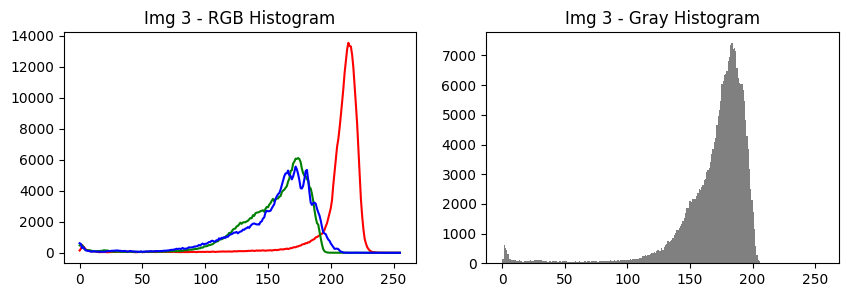

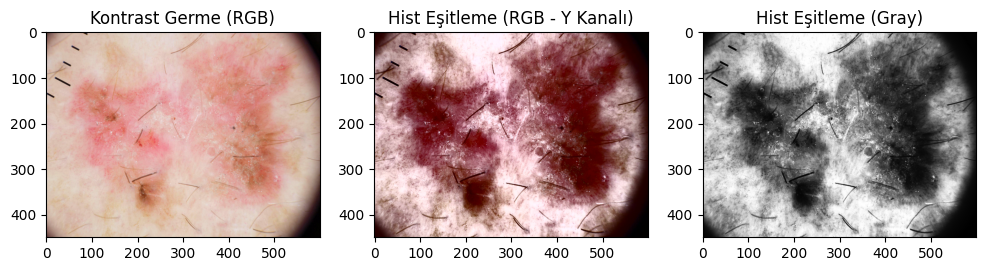

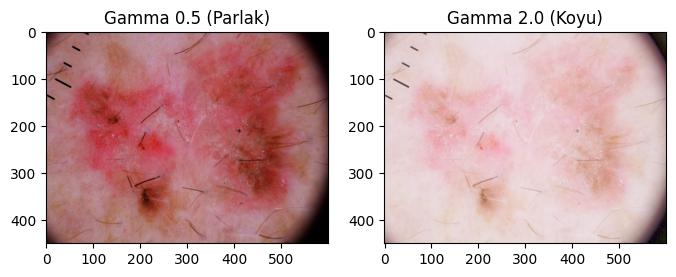

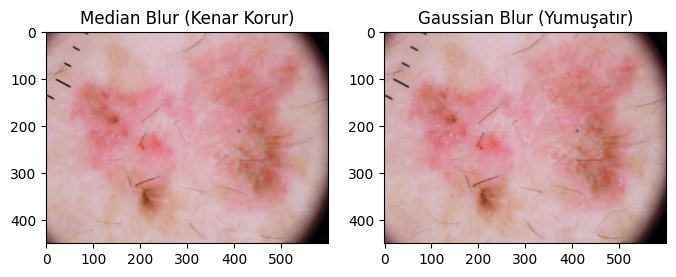

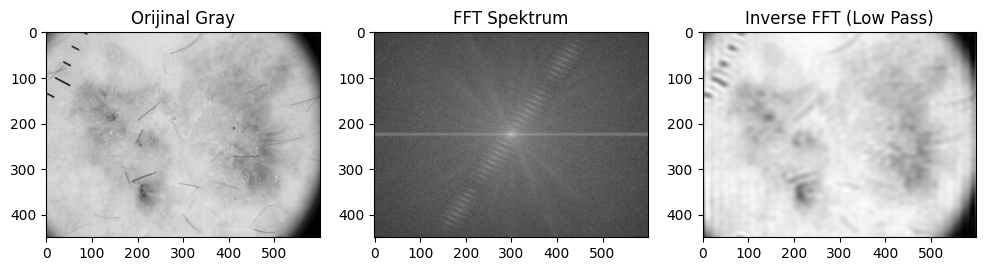

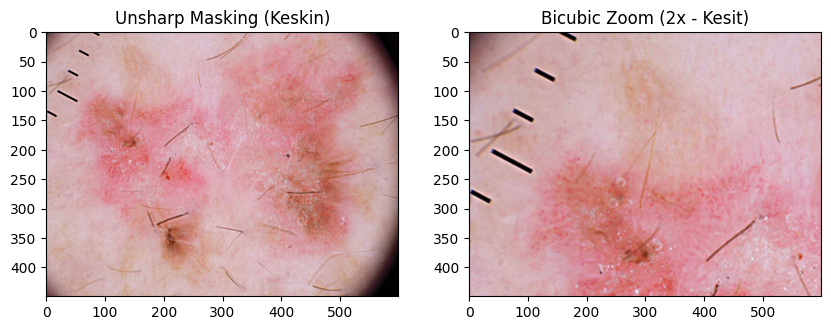


==================== GÖRÜNTÜ 4 ANALİZİ ====================
RGB -> Mean: 139.07, Std: 60.27
Gray -> Mean: 134.89, Std: 57.98


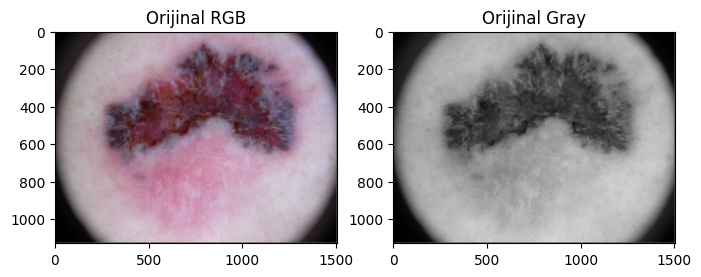

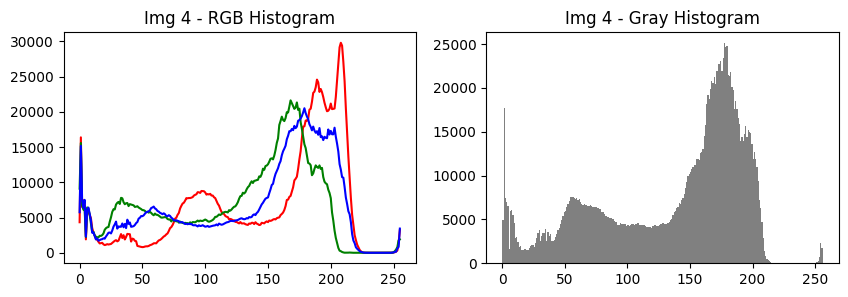

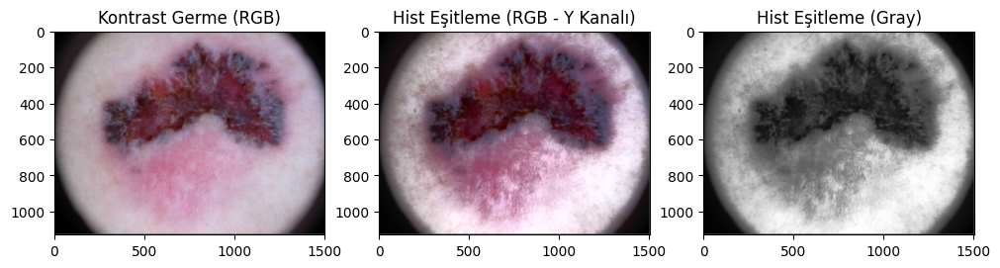

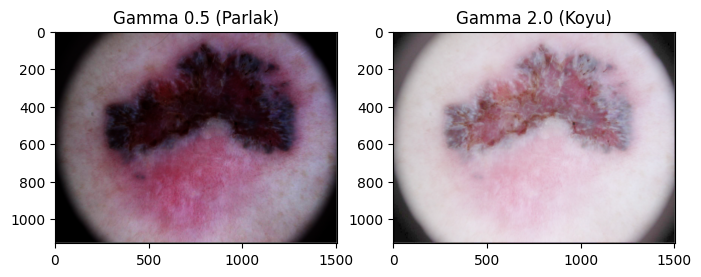

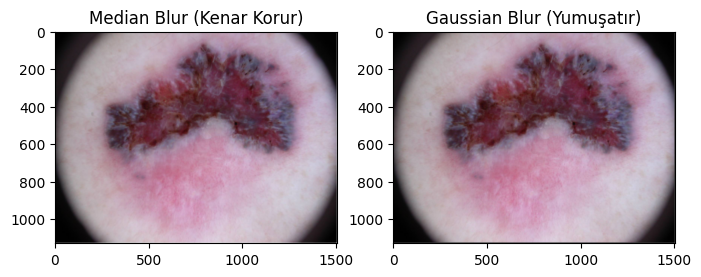

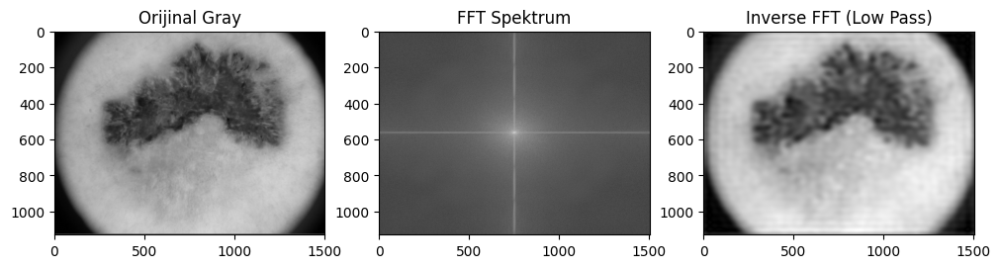

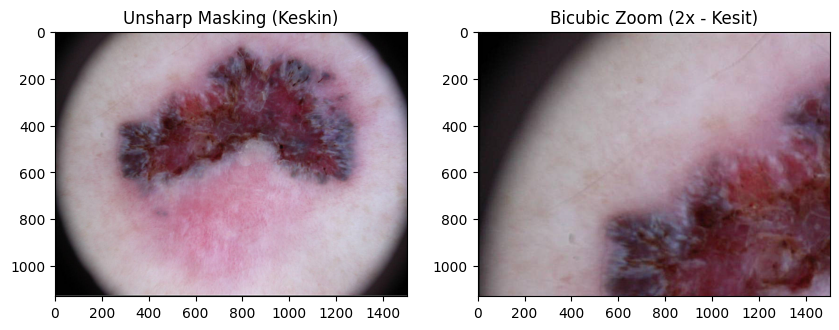


==================== GÖRÜNTÜ 5 ANALİZİ ====================
RGB -> Mean: 177.96, Std: 51.69
Gray -> Mean: 170.71, Std: 40.91


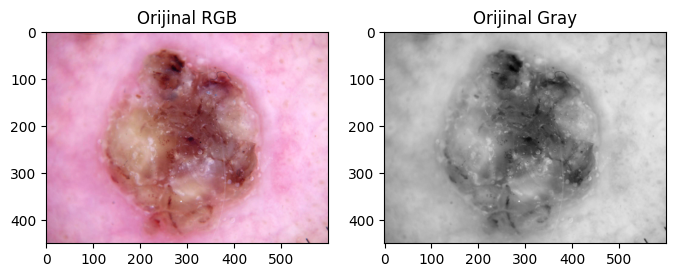

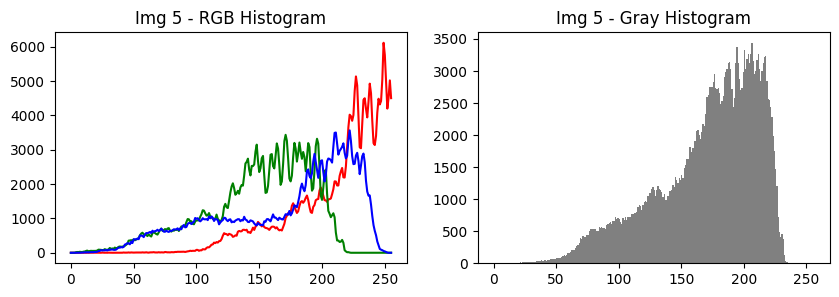

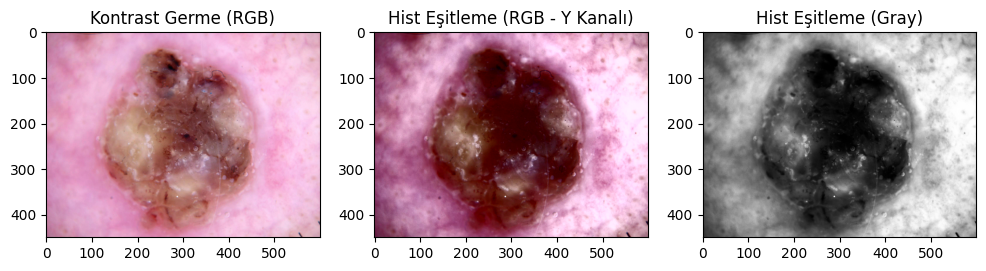

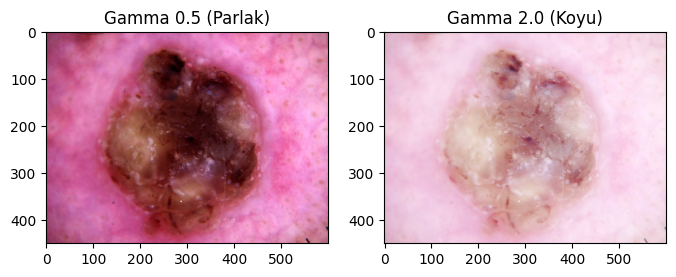

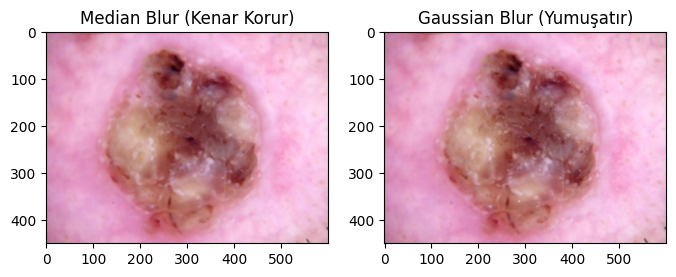

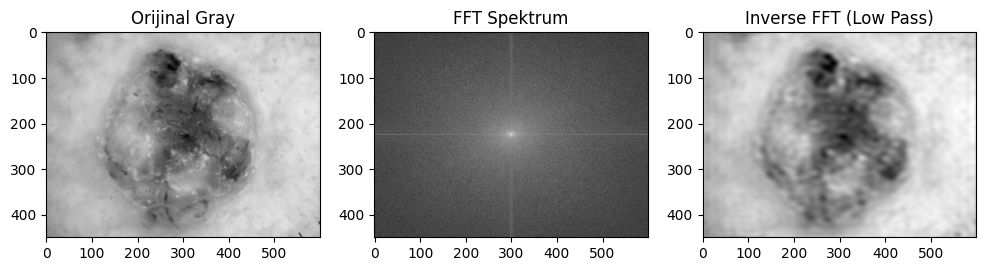

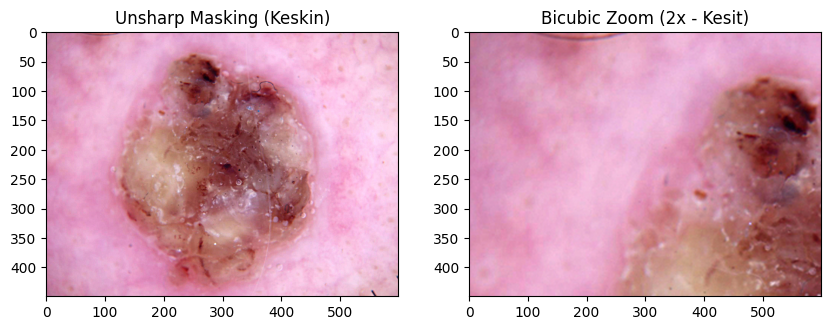


==================== GÖRÜNTÜ 6 ANALİZİ ====================
RGB -> Mean: 167.48, Std: 36.92
Gray -> Mean: 157.44, Std: 18.59


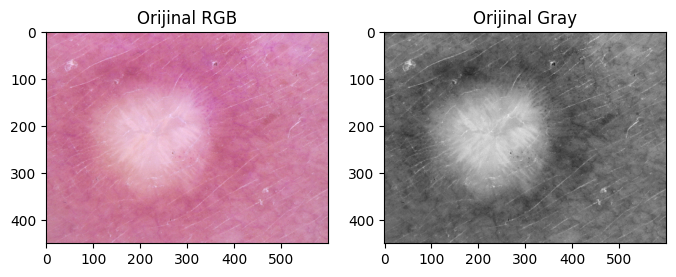

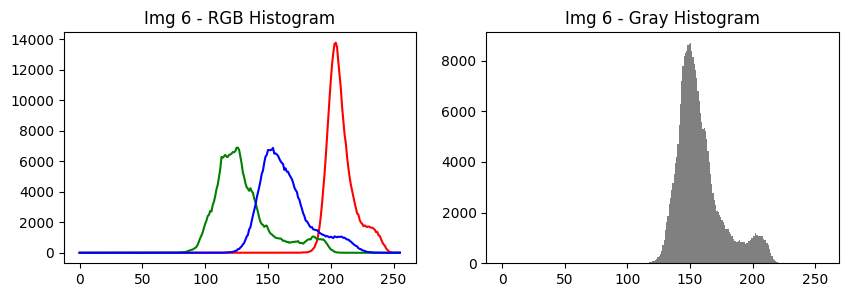

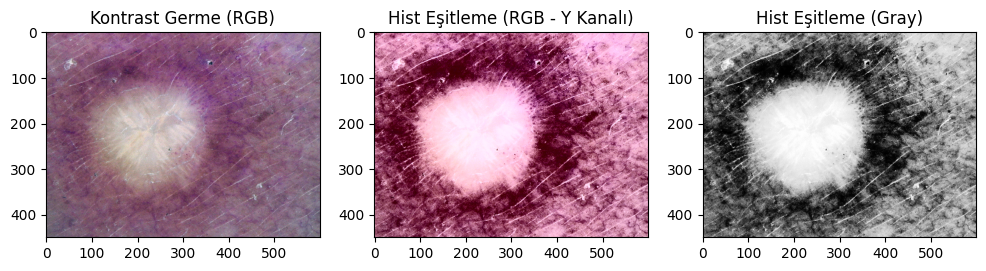

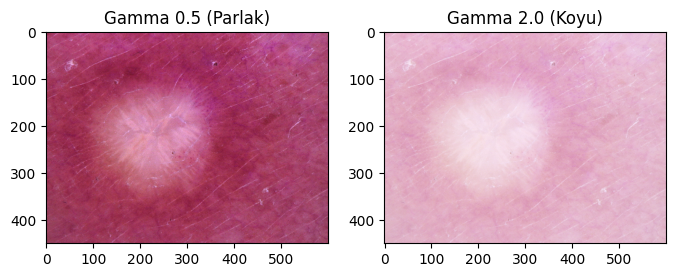

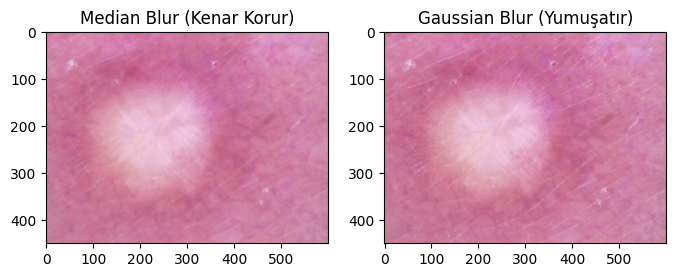

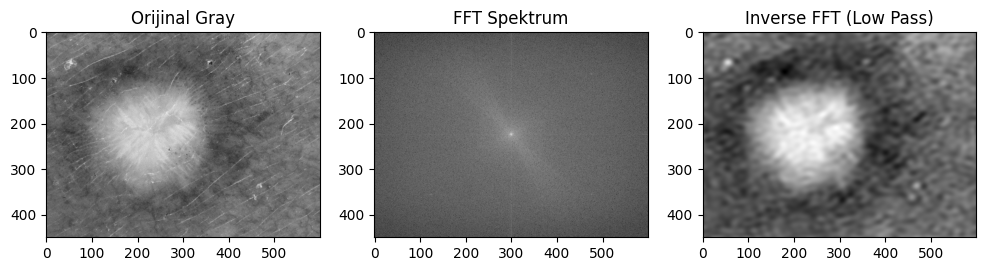

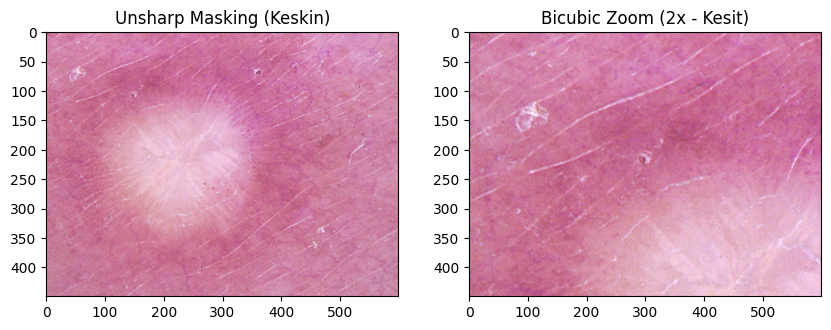


==================== GÖRÜNTÜ 7 ANALİZİ ====================
RGB -> Mean: 171.96, Std: 21.39
Gray -> Mean: 168.92, Std: 16.67


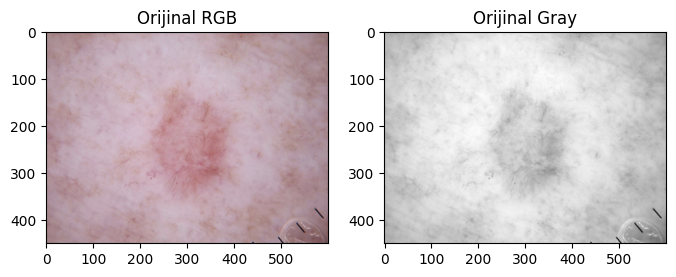

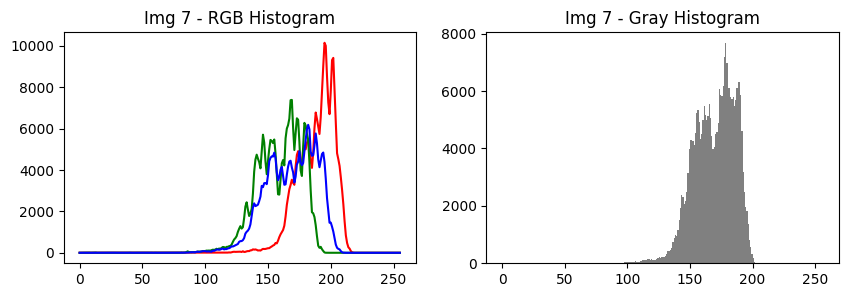

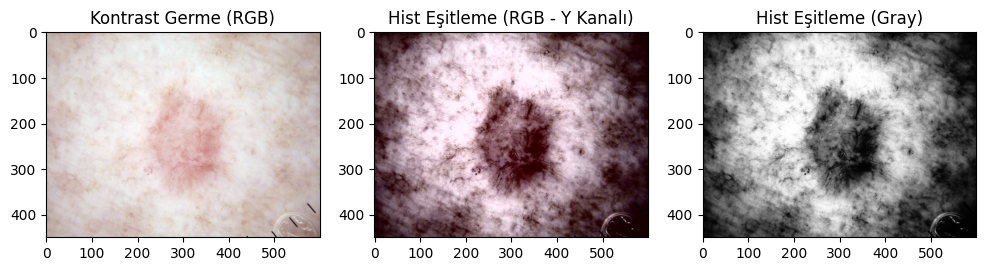

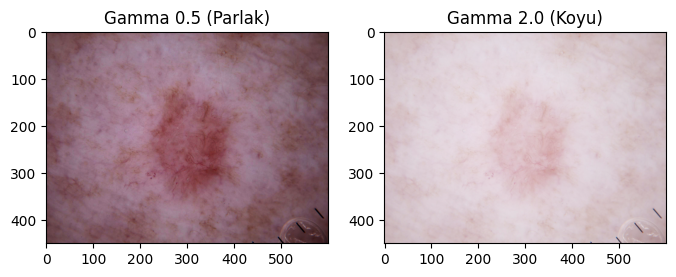

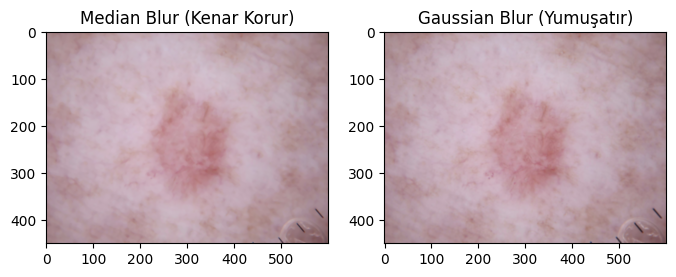

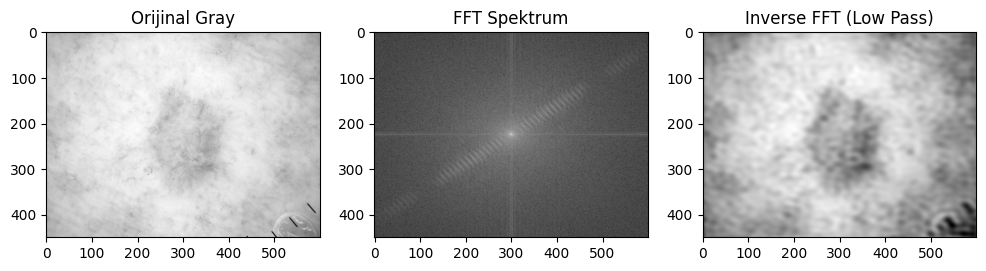

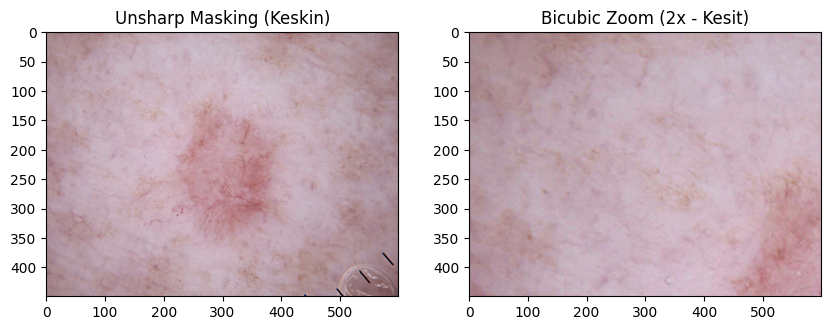


==================== GÖRÜNTÜ 8 ANALİZİ ====================
RGB -> Mean: 160.75, Std: 32.46
Gray -> Mean: 160.58, Std: 28.52


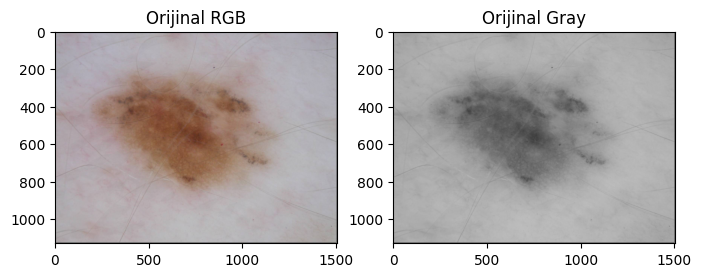

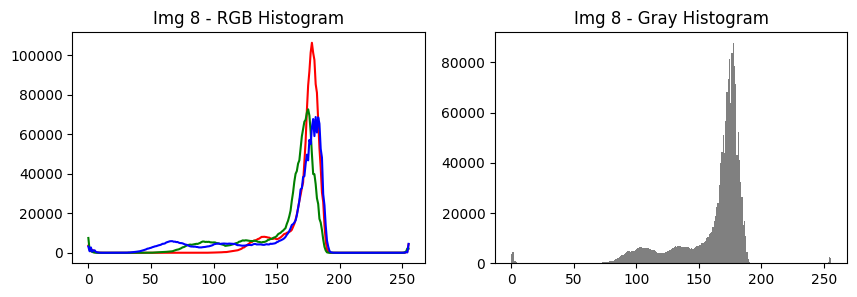

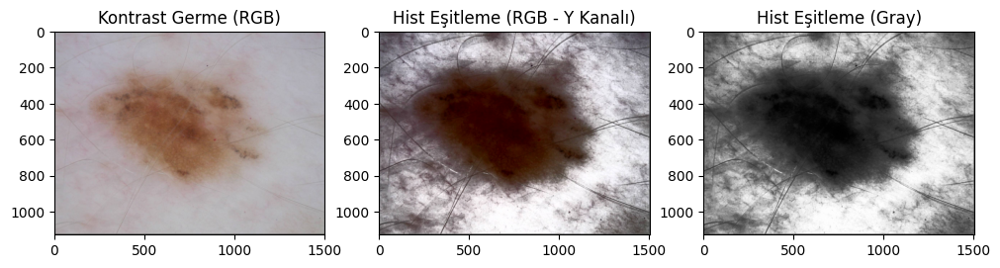

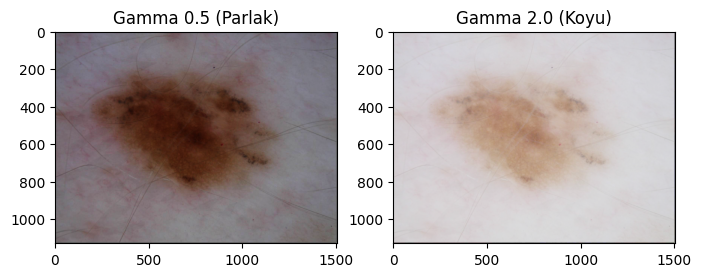

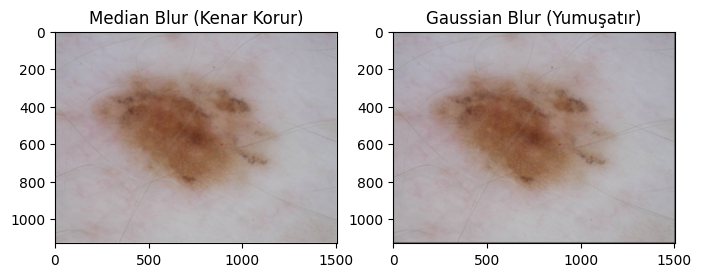

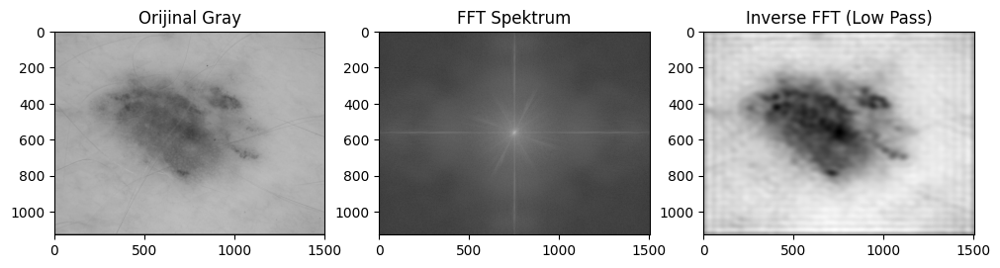

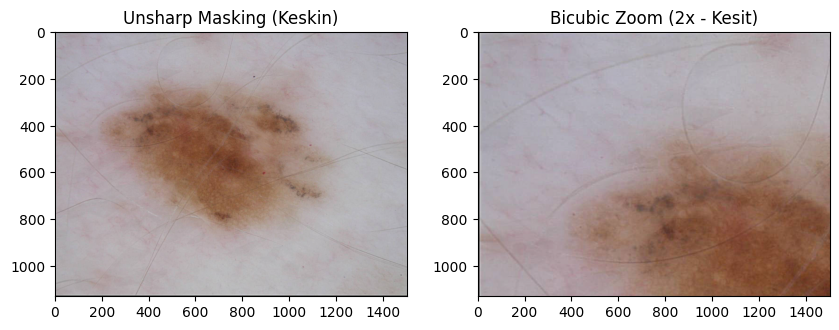


==================== GÖRÜNTÜ 9 ANALİZİ ====================
RGB -> Mean: 169.36, Std: 50.50
Gray -> Mean: 162.48, Std: 17.33


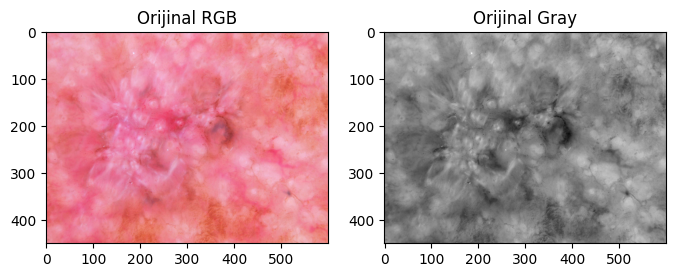

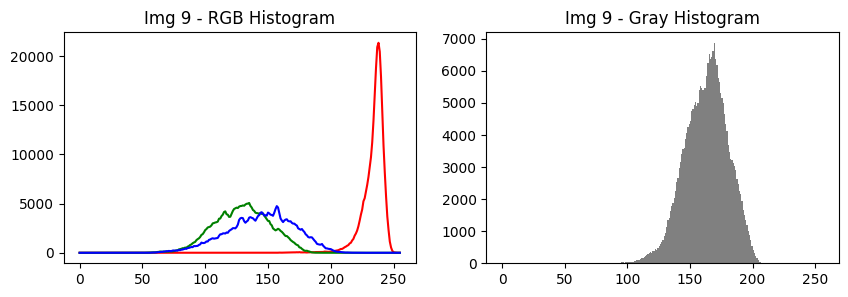

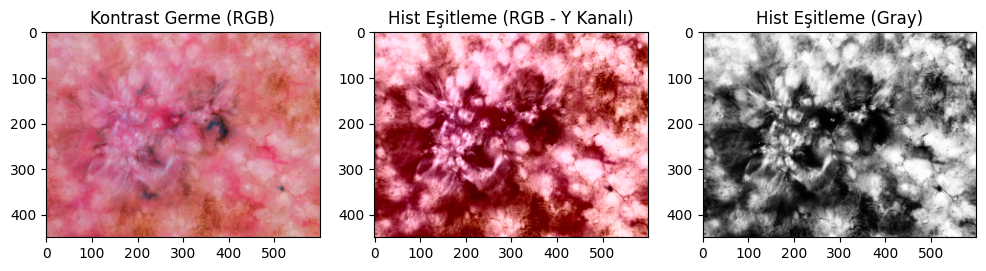

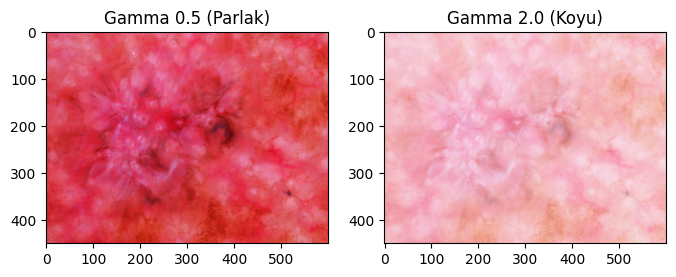

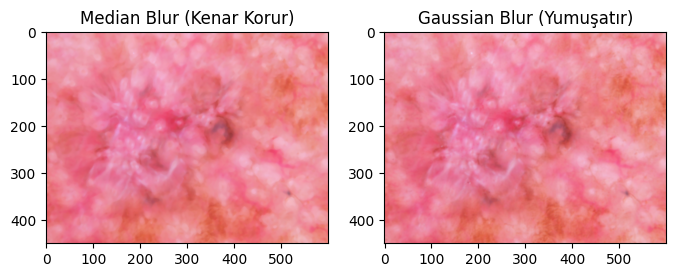

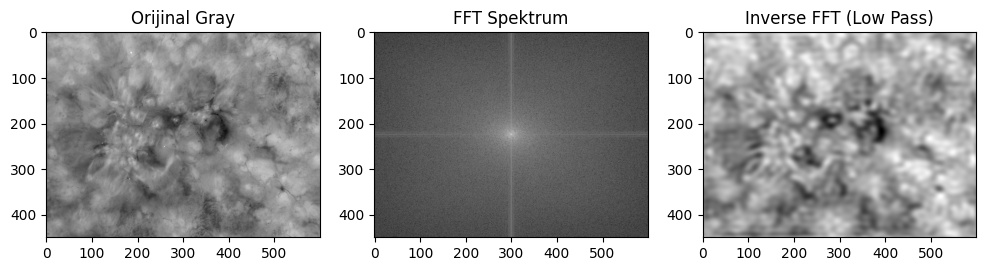

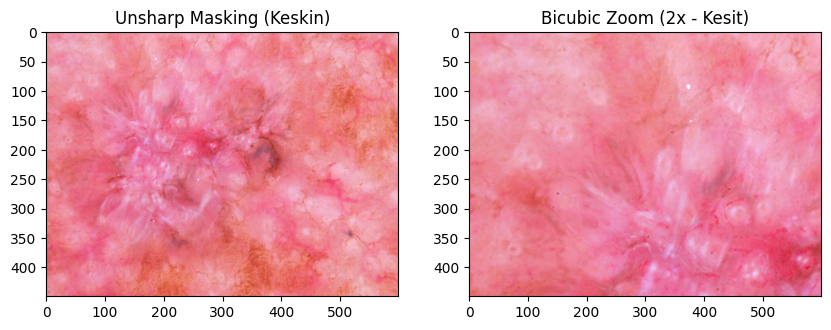

In [2]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import BytesIO
from PIL import Image

# Grafiklerin satır içi görünmesi için
%matplotlib inline

# =============================================================================
# 1. VERİ YÜKLEME VE HAZIRLIK
# =============================================================================

dataset_dir = "/content/skin-cancer9-classesisic"

# Veri setini hazırla
print(f"'{dataset_dir}' klasörü bulundu, veriler buradan okunacak.")

# Dosya yollarını DataFrame'e yükle
image_paths = []
for dirname, _, filenames in os.walk(dataset_dir):
    for filename in filenames:
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_paths.append(os.path.join(dirname, filename))

train_df = pd.DataFrame({'path': image_paths})
print(f"Toplam Görüntü Sayısı: {len(train_df)}")
print(train_df.head())

# --- 1.3 Veri Özellikleri ---
def analyze_properties(df):
    resolutions, channels_list, sizes = [], [], []
    for p in df['path']:
        img = cv2.imread(p)
        if img is not None:
            resolutions.append(img.shape[:2])
            channels_list.append(img.shape[2] if len(img.shape)>2 else 1)
            sizes.append(os.path.getsize(p)/1024)
    if resolutions:
        print(f"\nOrtalama Çözünürlük: {np.mean(resolutions, axis=0).astype(int)}")
        print(f"Ortalama Dosya Boyutu: {np.mean(sizes):.2f} KB")

analyze_properties(train_df)

# 9 Adet Rastgele Görüntü Seç
# (Eğer 9'dan az varsa hepsini al)
sample_count = min(9, len(train_df))
selected_paths = train_df.sample(sample_count, random_state=42)['path'].values

# =============================================================================
# FONKSİYON TANIMLARI
# =============================================================================

def show_histograms(img_rgb, img_gray, title_prefix):
    """ RGB ve Grayscale Histogram Çizer """
    plt.figure(figsize=(10, 3))

    # RGB Histogram
    plt.subplot(1, 2, 1)
    colors = ('r', 'g', 'b')
    for i, col in enumerate(colors):
        hist = cv2.calcHist([img_rgb], [i], None, [256], [0, 256])
        plt.plot(hist, color=col)
    plt.title(f"{title_prefix} - RGB Histogram")

    # Grayscale Histogram
    plt.subplot(1, 2, 2)
    plt.hist(img_gray.ravel(), bins=256, range=[0, 256], color='gray')
    plt.title(f"{title_prefix} - Gray Histogram")
    plt.show()

def contrast_stretching(img):
    """ Kontrast Germe Uygular """
    norm_img = np.zeros(img.shape)
    if len(img.shape) == 3: # RGB
        for i in range(3):
            c_min, c_max = np.min(img[:,:,i]), np.max(img[:,:,i])
            if c_max - c_min > 0:
                norm_img[:,:,i] = (img[:,:,i] - c_min) * (255.0 / (c_max - c_min))
            else:
                norm_img[:,:,i] = img[:,:,i]
    else: # Gray
        c_min, c_max = np.min(img), np.max(img)
        if c_max - c_min > 0:
            norm_img = (img - c_min) * (255.0 / (c_max - c_min))
        else:
            norm_img = img
    return np.uint8(norm_img)

def histogram_equalization_rgb(img_bgr):
    """ RGB için Y Kanalında Eşitleme """
    yuv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2YCrCb)
    yuv[:,:,0] = cv2.equalizeHist(yuv[:,:,0])
    return cv2.cvtColor(yuv, cv2.COLOR_YCrCb2RGB)

def apply_gamma(image, gamma=1.0):
    """ Gamma Düzeltme """
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(image, table)

def apply_fft_mask(img_gray):
    """ FFT ve Alçak Geçiren Filtre """
    rows, cols = img_gray.shape
    crow, ccol = rows//2, cols//2

    # FFT
    dft = np.fft.fft2(img_gray)
    dft_shift = np.fft.fftshift(dft)

    # Maske (Low Pass Filter - Merkez Beyaz)
    mask = np.zeros((rows, cols), np.uint8)
    r = 30 # Yarıçap
    y, x = np.ogrid[:rows, :cols]
    mask_area = (x - ccol)**2 + (y - crow)**2 <= r*r
    mask[mask_area] = 1

    # Maskeyi Uygulama
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.abs(img_back)

    # Görselleştirme için spektrum
    magnitude_spectrum = 20 * np.log(np.abs(dft_shift) + 1)

    return magnitude_spectrum, img_back

# =============================================================================
# Seçilen Görüntüler Üzerinde İşlemler
# =============================================================================

for idx, path in enumerate(selected_paths):
    print(f"\n{'='*20} GÖRÜNTÜ {idx+1} ANALİZİ {'='*20}")

    # Orijinal Okuma
    img_bgr = cv2.imread(path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # 2. İstatistikler
    print(f"RGB -> Mean: {img_rgb.mean():.2f}, Std: {img_rgb.std():.2f}")
    print(f"Gray -> Mean: {img_gray.mean():.2f}, Std: {img_gray.std():.2f}")

    # 2. Görselleştirme (Orijinal)
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1), plt.imshow(img_rgb), plt.title("Orijinal RGB")
    plt.subplot(1, 2, 2), plt.imshow(img_gray, cmap='gray'), plt.title("Orijinal Gray")
    plt.show()

    # 2.3 Histogramlar
    show_histograms(img_rgb, img_gray, f"Img {idx+1}")

    # 3. İyileştirme (Stretching & Equalization)
    str_rgb = contrast_stretching(img_rgb)
    eq_rgb = histogram_equalization_rgb(img_bgr) # RGB Equalization
    eq_gray = cv2.equalizeHist(img_gray)         # Gray Equalization

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1), plt.imshow(str_rgb), plt.title("Kontrast Germe (RGB)")
    plt.subplot(1, 3, 2), plt.imshow(eq_rgb), plt.title("Hist Eşitleme (RGB - Y Kanalı)")
    plt.subplot(1, 3, 3), plt.imshow(eq_gray, cmap='gray'), plt.title("Hist Eşitleme (Gray)")
    plt.show()

    # 3.3 Gamma Düzeltme (0.5 ve 2.0)
    g_05 = apply_gamma(img_rgb, 0.5)
    g_20 = apply_gamma(img_rgb, 2.0)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1), plt.imshow(g_05), plt.title("Gamma 0.5 (Parlak)")
    plt.subplot(1, 2, 2), plt.imshow(g_20), plt.title("Gamma 2.0 (Koyu)")
    plt.show()

    # 4. Gürültü Azaltma (Median vs Gaussian)
    median = cv2.medianBlur(img_rgb, 5)
    gaussian = cv2.GaussianBlur(img_rgb, (5, 5), 0)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1), plt.imshow(median), plt.title("Median Blur (Kenar Korur)")
    plt.subplot(1, 2, 2), plt.imshow(gaussian), plt.title("Gaussian Blur (Yumuşatır)")
    plt.show()

    # 5. Dönüştürme (Rotate & Flip)
    rows, cols = img_gray.shape
    angle = np.random.uniform(0, 10) # 0-10 derece
    M = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1)
    rotated = cv2.warpAffine(img_rgb, M, (cols, rows))
    flipped = cv2.flip(img_rgb, 1) # Yatay ayna

    # 6. FFT Analizi
    mag_spec, fft_reconstructed = apply_fft_mask(img_gray)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1), plt.imshow(img_gray, cmap='gray'), plt.title("Orijinal Gray")
    plt.subplot(1, 3, 2), plt.imshow(mag_spec, cmap='gray'), plt.title("FFT Spektrum")
    plt.subplot(1, 3, 3), plt.imshow(fft_reconstructed, cmap='gray'), plt.title("Inverse FFT (Low Pass)")
    plt.show()

    # 7. Keskinleştirme ve Enterpolasyon
    # Unsharp Masking: Original + (Original - Blurred) * amount
    blur_temp = cv2.GaussianBlur(img_rgb, (9,9), 10.0)
    unsharp = cv2.addWeighted(img_rgb, 1.5, blur_temp, -0.5, 0)

    # Bicubic 2x Zoom
    h, w, _ = img_rgb.shape
    zoomed = cv2.resize(unsharp, (w*2, h*2), interpolation=cv2.INTER_CUBIC)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1), plt.imshow(unsharp), plt.title("Unsharp Masking (Keskin)")

    # Zoom edilmiş görüntünün sadece bir kısmı (Cropped)
    plt.subplot(1, 2, 2), plt.imshow(zoomed[0:h, 0:w]), plt.title("Bicubic Zoom (2x - Kesit)")
    plt.show()